## Lab 3 
#### Project by William Trevino, Alex Salamah, Christopher Graves, Hannah Kosinovsky

# Business Understanding 1

###### Describe the purpose of the data set you selected (i.e., why was this data collected in the first place?). How will you measure the effectiveness of a good algorithm? Why does your chosen validation method make sense for this specific dataset and the stakeholders needs?

We used The Belk Endowment Educational Attainment Data Repository for North Carolina Public Schools found at https://github.com/jakemdrew/EducationDataNC.

These data were collected for both Public and Charter schools starting in 2002 (school year 2001-2002) through 2017. The Data collected for both Public and Charter Schools in order to gain insight into several dimensionalities that could ultimatly contribute to students success. These factors range from funding, diversity, teacher performance, and educational attainment, to socio-economical.

These data were collected for all public schools totaling 2,733 and for our analysis we're using data from 4 years 2014-2017.

The information found by studying this information could give better insight to educators, lawmakers, and even parents on what factors influence good schools and therefore successful students

This data was collected in order to help get a better overview of the funding, diversity, teacher performance, and educational attainment, as well as many other factors, about all the public schools in North Carolina.

In our dataset we created by concatinating the datasets available in the EducationDataNC githug, we have information on 2,733 schools over a period of 4 years 2014-2017.

The dataset contains many potential indicators for school success. The information found by studying this information could give better insight to educators, lawmakers, and even parents on what factors influence good schools and therefore successful students

Our goal for this exercise is to break the school into relavent related clusters for targeted educational programing to be created. To test the quality of the clusters we will use the Davies-Bouldin Index as it metrics on the average similarity between clusters where a lower score relates to a model with better seperation between clusters and since we want as unique as possible clusters we should minimize this value.

# Data Understanding 1

Define and prepare your class variables. Use proper variable representations (int, float, one-hot, etc.). Use pre-processing methods (as needed) for dimensionality reduction, scaling, etc. Remove variables that are not needed/useful for the analysis.

In [4]:
import time
import pandas as pd
import numpy as np
from scipy import stats
from sklearn.metrics import davies_bouldin_score



import seaborn as sns; sns.set()
import matplotlib.pyplot as plt
%matplotlib inline

from IPython.core.interactiveshell import InteractiveShell
#InteractiveShell.ast_node_interactivity = "all"

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings("ignore")

df = pd.read_csv('data.csv')
df.head()

,Unnamed: 0,student_num,lea_avg_student_num,st_avg_student_num,Math I_Size,lea_total_expense_num,lea_salary_expense_pct,lea_services_expense_pct,lea_supplies_expense_pct,lea_instruct_equip_exp_pct,...,esea_status_P,Grad_project_status_Y,SPG Grade_B,SPG Grade_C,SPG Grade_D,SPG Grade_F,SPG Grade_I,EVAAS Growth Status_Met,EVAAS Growth Status_NotMet,unit_code
0,0,78.0,954.0,837.0,0.0,8028.59,0.613,0.078,0.086,0.011,...,0,0,0,0,0,0,0,0,0,10303
1,1,539.0,518.0,496.0,0.0,8028.59,0.613,0.078,0.086,0.011,...,0,0,0,1,0,0,0,0,0,10304
2,2,547.0,518.0,496.0,0.0,8028.59,0.613,0.078,0.086,0.011,...,0,0,0,1,0,0,0,1,0,10308
3,3,800.0,768.0,665.0,26.0,8028.59,0.613,0.078,0.086,0.011,...,0,0,0,0,0,1,0,0,1,10310
4,4,664.0,518.0,496.0,0.0,8028.59,0.613,0.078,0.086,0.011,...,0,0,1,0,0,0,0,0,0,10312


#### Since we used the same dataset in all our labs, we imported the previously cleaned data above as data.csv. However, for consistency, we have included the code we used to clean the data below. 

####  In addition, we added more context for this problem. 

In [2]:
base = 'MSDS 7331/Dataset/EducationDataNC-master/'
file2014 = base + '2014/Machine Learning Datasets/PublicSchools2014_ML.csv'
file2015 = base + '2015/Machine Learning Datasets/PublicSchools2015_ML.csv'
file2016 = base + '2016/Machine Learning Datasets/PublicSchools2016_ML.csv'
file2017 = base + '2017/Machine Learning Datasets/PublicSchools2017_ML.csv'
df2014 = pd.read_csv(file2014)
df2015 = pd.read_csv(file2015)
df2016 = pd.read_csv(file2016)
df2017 = pd.read_csv(file2017)

df_full = pd.concat([df2014,df2015,df2016,df2017], axis=0, ignore_index=True, sort=False)

###### Since the dataset we created is the combination of the 2014-2017 pre-cleaned Machine Learning data sets found in the EducationDataNC repository, it  has already been cleared of missing data, duplicate data and outliers so none are present to fix.  However, we may have created NaN values when we concatinated the 4 datasets if there was one year where the data did not have a feature found in another year. 

###### We checked this below and found that while the 4 separate datasets had 0 nulls, our combined dataset had 931697 null values. 

###### While we are not using all of the attributes in this analysis we will clean the data in case we wish to explore these exluded features later

#### We wanted to work with data that was present across all years. Meaning, we didn't want to include features in our model that were only measured sometimes between 2014-2017. Therefore, we decided to use the method shown below in order for our approach to be more balanced. 

#### Since we are dealing with 4 years it is expected that if a feature only exists in one year it would appear in at least 25% if all years had equal

In [3]:
df_temp = df_full.loc[:, df_full.isnull().mean() < .20]

#### Next we want to remove the outliers by only keeping values within 3 standard deviations of the mean.

In [4]:
df_compare = df_temp[np.abs(df_temp-df_temp.mean()) <= (3*df_temp.std())]
df_temp.shape
df_compare.shape
df_temp.equals(df_compare)
df_temp['crime_per_c_num'].describe()

count    9731.000000
mean        0.918389
std        13.021564
min         0.000000
25%         0.000000
50%         0.250000
75%         0.840000
max      1254.550000
Name: crime_per_c_num, dtype: float64

In [5]:
df_compare['crime_per_c_num'].describe()

count    9722.000000
mean        0.733897
std         1.862658
min         0.000000
25%         0.000000
50%         0.250000
75%         0.830000
max        36.360000
Name: crime_per_c_num, dtype: float64

In [6]:
df_compare.isnull().sum().sum()

36480

From the output of the isnull() function above we see that there were a lot of values outside of 6 standard deviations.

In [7]:
df_full = df_compare
df_full.shape
df_temp.shape
df.shape

(9731, 256)

In [8]:
df.describe()
df['total_perpupil_num'] = df['lea_federal_perpupil_num'] + df['lea_local_perpupil_num'] + df['lea_state_perpupil_num']
df['total_perpupil_num'].describe()

count     9731.000000
mean      8867.882826
std        786.135532
min       7282.190000
25%       8352.280000
50%       8741.790000
75%       9286.270000
max      12155.970000
Name: total_perpupil_num, dtype: float64

In [9]:
df_full['lea_sat_avg_score_num'].describe()

count    9694.00000
mean      996.44347
std        70.40001
min       771.00000
25%       954.00000
50%       999.00000
75%      1042.00000
max      1205.00000
Name: lea_sat_avg_score_num, dtype: float64

#### Our variables:

student_num - Number of students at school level - **float64 ranging from 1 to 2974**


crime_per_c_num - Number of crimes or acts of violence per 100 students at School level - **float64 ranging from 0 to 1254**


advance_dgr_pct - Percent of teachers with masters or higher degree at school level - **float64 ranging from 0 to 0.81**


_1yr_tchr_trnovr_pct - One Year Teacher turnover percentage at school level - **float64 ranging from 0 to 0.82**


lea_sat_avg_score_num - Average SAT Score (Critical Reading + Math) at the LEA Level. Local education agency, LEA, is a commonly used acronym for a school district.-  **float64 ranging from 588 to 2974**


lea_federal_perpupil_num - Federal expense per pupil at school level - **float64 ranging from 588 to 2974**


lea_local_perpupil_num - Local expense per pupil at LEA level - **float64 ranging from 588 to 2974**


lea_state_perpupil_num - State expense per pupil at LEA level -  **float64 ranging from 588 to 2974**


lea_salary_expense_pct - Percent of expense spent on Salaries at LEA level - **float64  ranging from 0.55 to 0.88**


lea_supplies_expense_pct - Percent of expense spent on Supplies at LEA level - **float64  ranging from 0.03 to 0.14**


lea_ap_participation_pct - Percentage of High School Students taking an AP exam at the LEA Level - **float64 ranging from 0 to 0.44**


lea_sat_participation_pct - Percentage of High School Seniors taking the SAT at the LEA Level - **float64 ranging from 0 to 0.82**

MinorityFemalePct - Percentage of students who are a minority race and female - **float64  ranging from 0 to .99**


MinorityMalePct - - Percentage of students who are a minority race and male - **float64 ranging from 0 to 1**


lea_avg_daily_attend_pct - Average daily attendance percentage at LEA level    - **float64 ranging from 0 to 0.99**


###### New variables
total_perpupil_num - a combined field of federal, state, and local per pupil funding - **float64 raning from 7282.19 to 17801.85 

# Data Understanding 2	

Visualize the any important attributes appropriately. Important: Provide an
interpretation for any charts or graphs.

Since we are trying to look at the relationships of different factors and whether or not students perform above average on the SATs or not as a measure of "success" at the school, we need to visualize the relationships of these variables to SAT scores. 

- number of students
- crime rate
- number of teachers with advanced degrees
- 1-year teacher turnover
- federal expense per pupil
- local expense per pupil
- state expense per pupil
- percent school expenditures on salaries 
- percent school expenditures on supplies
- participation in AP classes
- participation in the SAT
- percentage of minority female students
- school attendence 

These are all variables that could have an effect on a student's performance. 

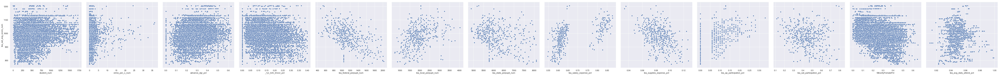

In [10]:
df_clustering = df[['lea_sat_avg_score_num', 'student_num', 'crime_per_c_num', 'advance_dgr_pct', '_1yr_tchr_trnovr_pct', 'lea_federal_perpupil_num', 'lea_local_perpupil_num', 'lea_state_perpupil_num', 'lea_salary_expense_pct', 'lea_supplies_expense_pct', 'lea_ap_participation_pct', 'lea_sat_participation_pct', 'MinorityFemalePct', 'lea_avg_daily_attend_pct']]
df_clustering.shape
sns.pairplot(df_clustering,
            y_vars=['lea_sat_avg_score_num'],
            x_vars=['student_num', 'crime_per_c_num', 'advance_dgr_pct', '_1yr_tchr_trnovr_pct', 'lea_federal_perpupil_num', 'lea_local_perpupil_num', 'lea_state_perpupil_num', 'lea_salary_expense_pct', 'lea_supplies_expense_pct', 'lea_ap_participation_pct', 'lea_sat_participation_pct', 'MinorityFemalePct', 'lea_avg_daily_attend_pct'],
            height=6)

###### For the sake of clustering we are going to greatly reduce the number of features we are working with to better visualize potential clusters

From the scatterplots above we see the following trends:
    
- student_num looks randomly scattered throughout the plot
- crime_per_c_num looks clustered at 0 on the x axis but with a wide spread throughout the y axis
- advance_dgr_pct seems to be randomly scattered
- 1yr_tchr_trnovr_pct looks to be randomly scattered
- lea_federal_perpupil_num seems to have a negative linear relationship with lea_sat_avg_score_num
- lea_local_perpupil_num seems to have a positive linear relationship with lea_sat_avg_score_num
- lea_state_perpupil_num seems to have a negative linear relationship with lea_sat_avg_score_num
- lea_salary_expense_pct seems to be clustered on the x axis on .6 and .8, but spread throughout the y axis. 
- lea_supplies_expense_pct seems to have a negative linear relationship with lea_sat_avg_score_num
- lea_ap_participation_pct seemse to have a positive linear relationship with lea_sat_avg_score_num
- lea_sat_participation_pct seemse to have a negative linear relationship with lea_sat_avg_score_num
- MinorityFemalePct seems to be randomly scattered
- lea_avg_daily_attend_pct seems to be clustered around .95 on the x-axis but evenly spread on the y axis. 

From this information we could potentially see some interesting trends. 

- crimes are rare in general and seem to have no linear relationship with scores overall. It would make sense that most school age children would not be involved in crime since the bulk of crimes in the US are committed by -mostly men- between the agest of 17-24. Since most children finish school when they are 18, the majority of school aged students would not fall into the bucket of those most likely to commit crimes. However, we would think that higher crime rates would be correlated with lower scores since students would be distracted from their studies. 
- federal and state expenditure on students is negatively linearly correlated with SAT scores while local expenditure on students is positively correlated with SAT scores. This is interesting because we would assume that any increase in expenditure would increase scores, but this could point to local funds being managed better or allocated more efficiently. Or perhaps point to the fact that federal and state funding cannot make up for areas with less wealth. 
- AP class participation is positively linearly corrrelated with SAT scores. This makes sense because students who take on more responsibility to study in classes that are not mandatory would likely be more prepared for SATs. 
- SAT participation is actually negatively correlated with SAT scores, perhaps because a higher participation rate brings in kids who were not motivated on their own accord and perhaps less inclined to study for the exam overall. 
- attendence is overall high, which makes sense since parents are legally obligated to take their children to school unless they can prove home-schooling. 

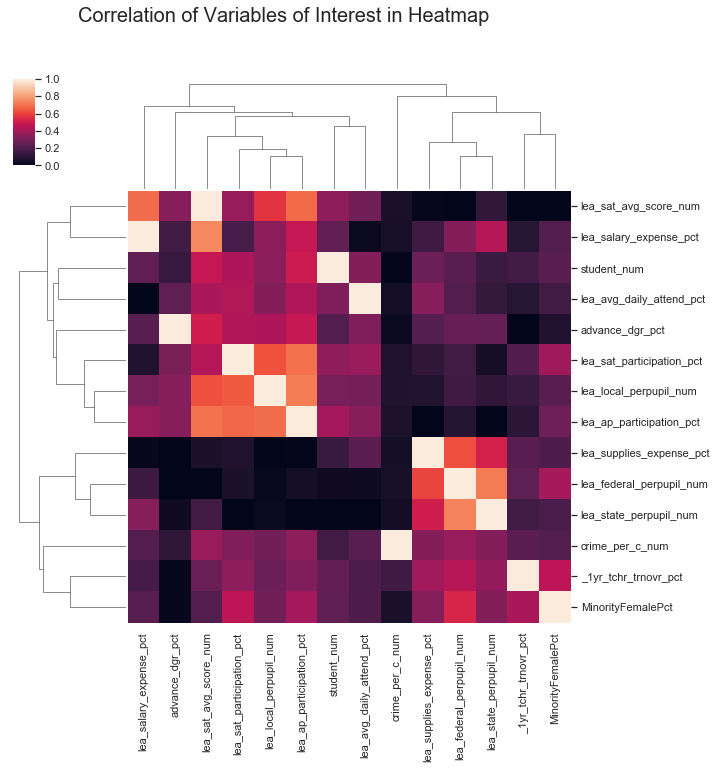

In [11]:
cluster = sns.clustermap(df_clustering.corr(), standard_scale=1)
cluster.fig.suptitle("Correlation of Variables of Interest in Heatmap", fontsize=20)
plt.show()

###### The heatmap shows which variables are correlated with one another based on the row and column values. The darkest squares represent no correlation between the variables and the lightest squares represent a high correlation. 

###### From this plot we observe that lea_sat_average_score_num is highly correlated with lea_salary_expense_pct as well as lea_local_perpupil_num and lea_ap_participation_pct as well as a relatively high but less correlation with advance_degree_pct and student_num. This would make sense since we would expect that higher school salary expenditures could motivate better teacher performance in the classroom and thereby improve the attention students get. In addition, local expenditures on students increases the resources available for the school to provide for the students. In addition, we would expect that those students who elect to participate in AP courses, would take the initiative in their other studies, including the SAT. 

###### Conversely, lea_sat_average_score_num is almost not correlated at all with lea_federal_perpupil_num and lea_supplies_expense_pct. This is an interesting find, since local expenditure is correlated with higher scores. However, it may be the case that federal expenditure is not as targeted or allocated as well as local expenditure is. In addition, supplies could be seen as beneficial, but if the school is spending a larger proportion on salaries, then the proportion left for supplies in inversely related and it is possible that salaries of teachers are more important than supplies for learning. 

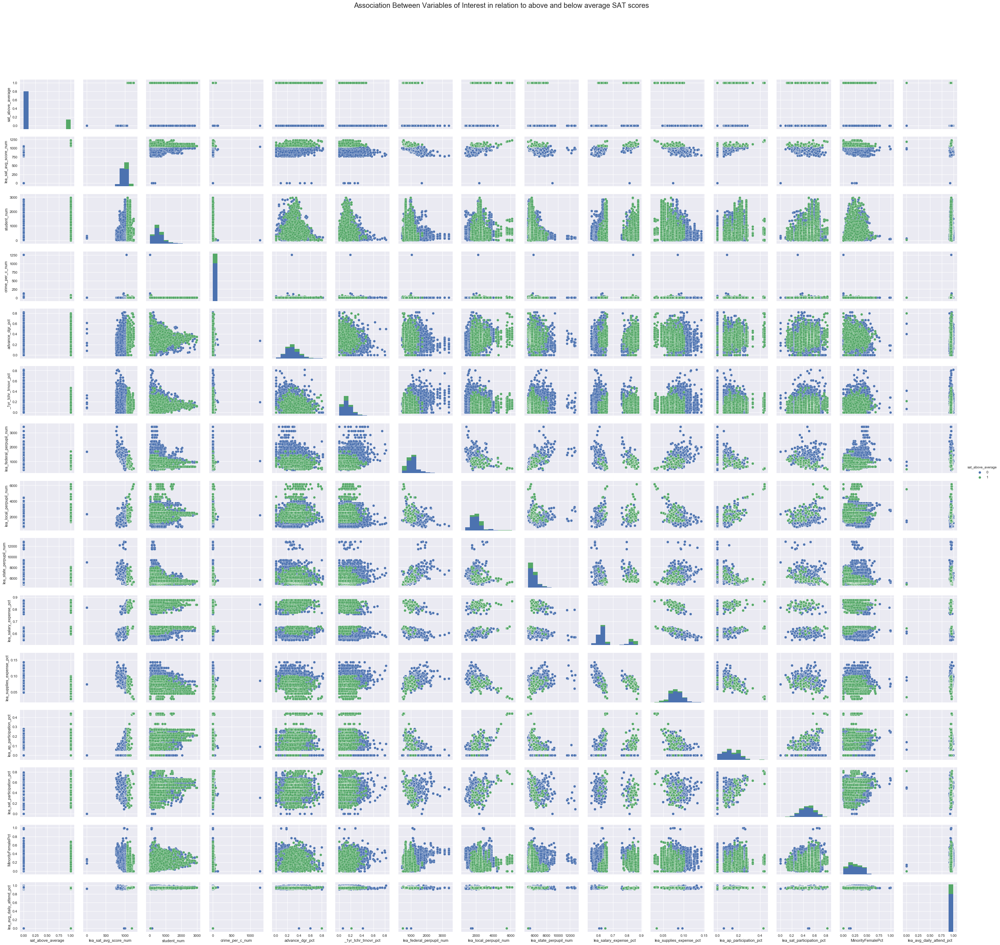

In [5]:
df['sat_above_average'] = np.where(df['lea_sat_avg_score_num'] > 1060, 1, 0)

df_clustering1 = df[["sat_above_average",'lea_sat_avg_score_num', 'student_num', 'crime_per_c_num', 'advance_dgr_pct', '_1yr_tchr_trnovr_pct', 'lea_federal_perpupil_num', 'lea_local_perpupil_num', 'lea_state_perpupil_num', 'lea_salary_expense_pct', 'lea_supplies_expense_pct', 'lea_ap_participation_pct', 'lea_sat_participation_pct', 'MinorityFemalePct', 'lea_avg_daily_attend_pct']]

sat_pairplot1 = sns.pairplot(df_clustering1, hue="sat_above_average")
plt.subplots_adjust(top=0.9)
sat_pairplot1.fig.suptitle("Association Between Variables of Interest in relation to above and below average SAT scores", fontsize=20)

plt.show()

#### In this lab, our goal is to perform clustering to provide targeted groups for educational programs that among other things try to increase the average performance on SAT scores per school, so it is important to see if there is any visible clustering in a 2d space between our variables of interest. to explore this, we used a scatterplot matrix with colors broken up by above and below average SAT scores to illustrate any clustering.  As shown in the legend on the right hand side of the graph, Above average SAT scores are green and below average SAT scores are blue. For the most part, there is no visible clustering, but we picked out a couple graphs that look like they exhibit clusters to explore more closely below. 

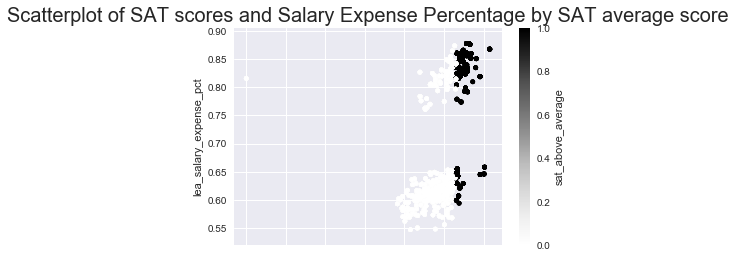

In [6]:
scatter1 = df.plot.scatter(x='lea_sat_avg_score_num', y='lea_salary_expense_pct', c="sat_above_average")
plt.title("Scatterplot of SAT scores and Salary Expense Percentage by SAT average score", fontsize=20)
plt.show()

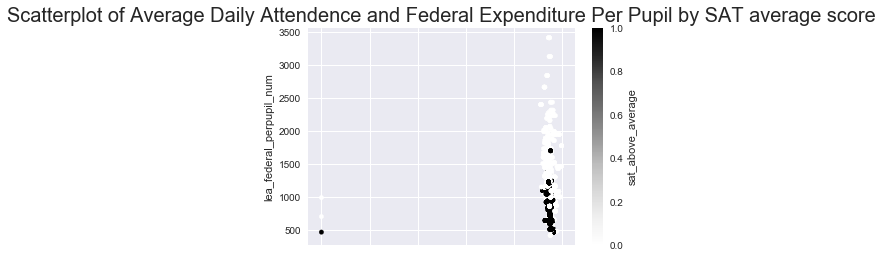

In [7]:
scatter2 = df.plot.scatter(x='lea_avg_daily_attend_pct', y='lea_federal_perpupil_num', c="sat_above_average")
plt.title("Scatterplot of Average Daily Attendence and Federal Expenditure Per Pupil by SAT average score", fontsize=20)
plt.show()

These plots give us a look at potential clustering we will see in our Modeling and evaluation portion. However, these are just correlations to observe potential patterns we will see and do not necessarily have to match up with our findings when we have finished constructing the model. In the first close look scatter you can clearly see too distinct clusters with groupings based on SAT scores and in the second graph it is clear that two groups appear in the association between Federal expenditure and Attendence based on SAT scores as evidenced by the clustering of black and white points respectively. 

# Modeling and Evaluation 1

Train and adjust parameters

Train: Perform cluster analysis using several clustering methods (adjust parameters).

### Clustering Models: Kmeans (mini batch), Agglomerative Clustering, Birch

In [13]:
cluster_stats = pd.DataFrame( columns = ['Model Name','Paramaters','Cluster Size', 'Execution Time', 'Score','Model'])

In [14]:
def plot_model(data, model, name):
    try:
        data['pred'] = model.predict(data)
    except:
        data['pred'] = model.fit_predict(data)
    pg = sns.pairplot(data,
            y_vars=['lea_sat_avg_score_num'],
            x_vars=['student_num', 'crime_per_c_num', 'advance_dgr_pct', '_1yr_tchr_trnovr_pct', 'lea_federal_perpupil_num', 'lea_local_perpupil_num', 'lea_state_perpupil_num', 'lea_salary_expense_pct', 'lea_supplies_expense_pct', 'lea_ap_participation_pct', 'lea_sat_participation_pct', 'MinorityFemalePct', 'lea_avg_daily_attend_pct'],
            height=4, hue='pred')
    pg.fig.suptitle(name, fontsize=16)

In [15]:
def run_model_cluster(df_temp, model_name, model_para, cluster_size, model):
    start = time.time()
    model.fit(df_temp)
    end = round(time.time() - start,4)
    labels = model.labels_
    score = round(davies_bouldin_score(df_temp, labels),4)
    print(model_name + " " + model_para + ": score:" + str(score) + " execute:"+ str(end))

    cluster_stats.loc[len(cluster_stats)] =  [model_name, model_para, cluster_size, end, score, model]


###### The above three blocks of code are setup functions  for simplifiying the running of each model.  The first line is a data frame to hold all statistics for the models tested along with the models themselves so when we compare and visualize them in later sections we do not have to retrain. We also split out cluster size so it would be easier to evaluate each cluster size accross multiple model types and paramerters.  The second is a plot function that does a pairplot with all features vs the 'lea_sat_avg_score_num' the primary number we have been evaluating all semester and which to understand better to maximize by the proposed targeted education plans for each cluster.  The third is a function for modeling each cluster and generating execution and score statistic and then storing them in the data frame generated in the first block of code in this section

In [16]:
from sklearn.cluster import MiniBatchKMeans

model_name = 'KMeans Mini'
kmean = pd.DataFrame()
## test, n_clusters, batch_size, ...
for C in range(2, 6, 1):
    for N in range(3, 6, 1):
        model_para = 'n_cluster=' + str(int(C)) + " n_init=" + str(int(N)) + " batch_size=" + str(50)
        km_model = MiniBatchKMeans(n_clusters=C, batch_size=50, random_state=101) 
        run_model_cluster(df_clustering, model_name, model_para, C, km_model)
        model_para = 'n_cluster=' + str(int(C)) + " n_init=" + str(int(N)) + " batch_size=" + str(250)
        km_model = MiniBatchKMeans(n_clusters=C, batch_size=250, random_state=101) 
        run_model_cluster(df_clustering, model_name, model_para, C, km_model)

KMeans Mini n_cluster=2 n_init=3 batch_size=50: score:1.1338 execute:0.0841
KMeans Mini n_cluster=2 n_init=3 batch_size=250: score:1.0597 execute:0.024
KMeans Mini n_cluster=2 n_init=4 batch_size=50: score:1.1338 execute:0.0871
KMeans Mini n_cluster=2 n_init=4 batch_size=250: score:1.0597 execute:0.022
KMeans Mini n_cluster=2 n_init=5 batch_size=50: score:1.1338 execute:0.0861
KMeans Mini n_cluster=2 n_init=5 batch_size=250: score:1.0597 execute:0.023
KMeans Mini n_cluster=3 n_init=3 batch_size=50: score:1.1471 execute:0.053
KMeans Mini n_cluster=3 n_init=3 batch_size=250: score:1.1739 execute:0.046
KMeans Mini n_cluster=3 n_init=4 batch_size=50: score:1.1471 execute:0.05
KMeans Mini n_cluster=3 n_init=4 batch_size=250: score:1.1739 execute:0.045
KMeans Mini n_cluster=3 n_init=5 batch_size=50: score:1.1471 execute:0.054
KMeans Mini n_cluster=3 n_init=5 batch_size=250: score:1.1739 execute:0.05
KMeans Mini n_cluster=4 n_init=3 batch_size=50: score:1.1038 execute:0.055
KMeans Mini n_clus

###### Below are the performance results for our clustering model trained above sorted by our Score metric

In [17]:
cluster_stats.loc[(cluster_stats['Model Name'] == 'KMeans Mini')].sort_values(by=['Score'], ascending=True)

,Model Name,Paramaters,Cluster Size,Execution Time,Score,Model
1,KMeans Mini,n_cluster=2 n_init=3 batch_size=250,2,0.0240,1.0597,"MiniBatchKMeans(batch_size=250, compute_labels..."
3,KMeans Mini,n_cluster=2 n_init=4 batch_size=250,2,0.0220,1.0597,"MiniBatchKMeans(batch_size=250, compute_labels..."
5,KMeans Mini,n_cluster=2 n_init=5 batch_size=250,2,0.0230,1.0597,"MiniBatchKMeans(batch_size=250, compute_labels..."
16,KMeans Mini,n_cluster=4 n_init=5 batch_size=50,4,0.0520,1.1038,"MiniBatchKMeans(batch_size=50, compute_labels=..."
12,KMeans Mini,n_cluster=4 n_init=3 batch_size=50,4,0.0550,1.1038,"MiniBatchKMeans(batch_size=50, compute_labels=..."
14,KMeans Mini,n_cluster=4 n_init=4 batch_size=50,4,0.0530,1.1038,"MiniBatchKMeans(batch_size=50, compute_labels=..."
0,KMeans Mini,n_cluster=2 n_init=3 batch_size=50,2,0.0841,1.1338,"MiniBatchKMeans(batch_size=50, compute_labels=..."
2,KMeans Mini,n_cluster=2 n_init=4 batch_size=50,2,0.0871,1.1338,"MiniBatchKMeans(batch_size=50, compute_labels=..."
4,KMeans Mini,n_cluster=2 n_init=5 batch_size=50,2,0.0861,1.1338,"MiniBatchKMeans(batch_size=50, compute_labels=..."
6,KMeans Mini,n_cluster=3 n_init=3 batch_size=50,3,0.0530,1.1471,"MiniBatchKMeans(batch_size=50, compute_labels=..."


###### For KMeans Mini Batch we focused on the following paramerters: Cluster size (2-5), Size of mini batches(50-250), and random initalizations (1-5)

###### Performance will be evaluated more robustly in the next section but it appears the higher batch size performed better with lower cluster counts and the low batch size performed better with higher cluster sizes. Also, a random note, but the even number cluster sizes on average did better than the odd number ones.  It would be best to compare only similiar sized clusters which we will look into in more detail in the evaluation section.

In [18]:
from sklearn.cluster import AgglomerativeClustering

model_name = 'Agglomerative Clustering'
## test, n_clusters, batch_size, ...
for C in range(2, 6, 1):
    model_para = 'n_cluster=' + str(int(C)) + " linkage=ward"
    sc_model = AgglomerativeClustering(n_clusters=C,  linkage="ward") 
    run_model_cluster(df, model_name, model_para, C, sc_model)
    
    model_para = 'n_cluster=' + str(int(C)) + " linkage=complete"
    sc_model = AgglomerativeClustering(n_clusters=C, linkage="complete") 
    run_model_cluster(df, model_name, model_para, C, sc_model)
    
    model_para = 'n_cluster=' + str(int(C)) + " linkage=average"
    sc_model = AgglomerativeClustering(n_clusters=C, linkage="average") 
    run_model_cluster(df, model_name, model_para, C, sc_model)
    
    model_para = 'n_cluster=' + str(int(C)) + " linkage=single"
    sc_model = AgglomerativeClustering(n_clusters=C, linkage="single") 
    run_model_cluster(df, model_name, model_para, C, sc_model)

Agglomerative Clustering n_cluster=2 linkage=ward: score:0.5345 execute:11.1212
Agglomerative Clustering n_cluster=2 linkage=complete: score:0.4945 execute:10.6248
Agglomerative Clustering n_cluster=2 linkage=average: score:0.4945 execute:10.855
Agglomerative Clustering n_cluster=2 linkage=single: score:0.4723 execute:9.7361
Agglomerative Clustering n_cluster=3 linkage=ward: score:0.5249 execute:11.0492
Agglomerative Clustering n_cluster=3 linkage=complete: score:0.5188 execute:10.6058
Agglomerative Clustering n_cluster=3 linkage=average: score:0.4814 execute:10.6929
Agglomerative Clustering n_cluster=3 linkage=single: score:0.4984 execute:9.7981
Agglomerative Clustering n_cluster=4 linkage=ward: score:0.4968 execute:10.9361
Agglomerative Clustering n_cluster=4 linkage=complete: score:0.5015 execute:10.5708
Agglomerative Clustering n_cluster=4 linkage=average: score:0.4574 execute:10.6058
Agglomerative Clustering n_cluster=4 linkage=single: score:0.4935 execute:9.7191
Agglomerative Clu

###### Below are the performance results for our clustering model trained above sorted by our Score metric

In [19]:
cluster_stats.loc[(cluster_stats['Model Name'] == 'Agglomerative Clustering')].sort_values(by=['Score'], ascending=True)

,Model Name,Paramaters,Cluster Size,Execution Time,Score,Model
34,Agglomerative Clustering,n_cluster=4 linkage=average,4,10.6058,0.4574,"AgglomerativeClustering(affinity='euclidean', ..."
37,Agglomerative Clustering,n_cluster=5 linkage=complete,5,10.6739,0.4721,"AgglomerativeClustering(affinity='euclidean', ..."
27,Agglomerative Clustering,n_cluster=2 linkage=single,2,9.7361,0.4723,"AgglomerativeClustering(affinity='euclidean', ..."
30,Agglomerative Clustering,n_cluster=3 linkage=average,3,10.6929,0.4814,"AgglomerativeClustering(affinity='euclidean', ..."
38,Agglomerative Clustering,n_cluster=5 linkage=average,5,10.5778,0.4891,"AgglomerativeClustering(affinity='euclidean', ..."
35,Agglomerative Clustering,n_cluster=4 linkage=single,4,9.7191,0.4935,"AgglomerativeClustering(affinity='euclidean', ..."
25,Agglomerative Clustering,n_cluster=2 linkage=complete,2,10.6248,0.4945,"AgglomerativeClustering(affinity='euclidean', ..."
26,Agglomerative Clustering,n_cluster=2 linkage=average,2,10.8550,0.4945,"AgglomerativeClustering(affinity='euclidean', ..."
32,Agglomerative Clustering,n_cluster=4 linkage=ward,4,10.9361,0.4968,"AgglomerativeClustering(affinity='euclidean', ..."
36,Agglomerative Clustering,n_cluster=5 linkage=ward,5,10.9201,0.4976,"AgglomerativeClustering(affinity='euclidean', ..."


###### For Agglomerative Clustering we looked at the following parmerters:  Cluster size (2-5) and which linkage criterion to use (single, complete, average, and ward)

###### Agglomerative Clustering seemed to have wildly different results compared to KMeans.  While it took much longer to execute (about 100 times longer)  we got much better scores.  It is noteable that the linkage criterion that is best was not consistent between all cluster sizes but instead changed with each one. This algorithm tends to perform better than the other two when it comes to larger clusters and is a good candidate for the best fit clusters that will need further evaluation with more domain related knowledge applied.

In [20]:
from sklearn.cluster import Birch

model_name = 'Birch'
## test, n_clusters, batch_size, ...
for C in range(2, 6, 1):
    for T in range(25, 125, 25):

        model_para = 'n_clusters=' + str(int(C)) + " threshold=" + str(float(T/100)) + " branching_factor=25"
        bir_model = Birch(n_clusters=C, threshold=(T/100), branching_factor=25) 
        run_model_cluster(df_clustering, model_name, model_para, C, bir_model)

        model_para = 'n_clusters=' + str(int(C)) + " threshold=" + str(float(T/100)) + " branching_factor=50"
        bir_model = Birch(n_clusters=C, threshold=(T/100), branching_factor=50) 
        run_model_cluster(df_clustering, model_name, model_para, C, bir_model)

        model_para = 'n_clusters=' + str(int(C)) + " threshold=" + str(float(T/100)) + " branching_factor=150"
        bir_model = Birch(n_clusters=C, threshold=(T/100), branching_factor=150) 
        run_model_cluster(df_clustering, model_name, model_para, C, bir_model)

Birch n_clusters=2 threshold=0.25 branching_factor=25: score:0.9734 execute:3.9353
Birch n_clusters=2 threshold=0.25 branching_factor=50: score:1.0069 execute:3.7931
Birch n_clusters=2 threshold=0.25 branching_factor=150: score:0.9734 execute:3.7641
Birch n_clusters=2 threshold=0.5 branching_factor=25: score:1.0116 execute:4.0524
Birch n_clusters=2 threshold=0.5 branching_factor=50: score:0.9734 execute:3.7501
Birch n_clusters=2 threshold=0.5 branching_factor=150: score:1.0069 execute:3.67
Birch n_clusters=2 threshold=0.75 branching_factor=25: score:1.0701 execute:3.642
Birch n_clusters=2 threshold=0.75 branching_factor=50: score:1.0142 execute:3.3158
Birch n_clusters=2 threshold=0.75 branching_factor=150: score:1.0621 execute:3.4168
Birch n_clusters=2 threshold=1.0 branching_factor=25: score:1.0243 execute:3.577
Birch n_clusters=2 threshold=1.0 branching_factor=50: score:1.0142 execute:3.3017
Birch n_clusters=2 threshold=1.0 branching_factor=150: score:1.0638 execute:3.3468
Birch n_cl

###### Below are the performance results for our clustering model trained above sorted by our Score metric

In [21]:
cluster_stats.loc[(cluster_stats['Model Name'] == 'Birch')].sort_values(by=['Score'], ascending=True)

,Model Name,Paramaters,Cluster Size,Execution Time,Score,Model
40,Birch,n_clusters=2 threshold=0.25 branching_factor=25,2,3.9353,0.9734,"Birch(branching_factor=25, compute_labels=True..."
42,Birch,n_clusters=2 threshold=0.25 branching_factor=150,2,3.7641,0.9734,"Birch(branching_factor=150, compute_labels=Tru..."
44,Birch,n_clusters=2 threshold=0.5 branching_factor=50,2,3.7501,0.9734,"Birch(branching_factor=50, compute_labels=True..."
41,Birch,n_clusters=2 threshold=0.25 branching_factor=50,2,3.7931,1.0069,"Birch(branching_factor=50, compute_labels=True..."
45,Birch,n_clusters=2 threshold=0.5 branching_factor=150,2,3.6700,1.0069,"Birch(branching_factor=150, compute_labels=Tru..."
43,Birch,n_clusters=2 threshold=0.5 branching_factor=25,2,4.0524,1.0116,"Birch(branching_factor=25, compute_labels=True..."
47,Birch,n_clusters=2 threshold=0.75 branching_factor=50,2,3.3158,1.0142,"Birch(branching_factor=50, compute_labels=True..."
50,Birch,n_clusters=2 threshold=1.0 branching_factor=50,2,3.3017,1.0142,"Birch(branching_factor=50, compute_labels=True..."
49,Birch,n_clusters=2 threshold=1.0 branching_factor=25,2,3.5770,1.0243,"Birch(branching_factor=25, compute_labels=True..."
55,Birch,n_clusters=3 threshold=0.5 branching_factor=25,3,3.8962,1.0317,"Birch(branching_factor=25, compute_labels=True..."


###### For Birch we looked at the following parmerters: Cluster size (2-5), threshold for sublustering(0.25-1.0), and branching factor (25,50,150)

###### Execution time wise this was about 3 times faster than Agglomerative Clustering but still much slower than Kmeans.  As for the score, it seemed this algorithm had the most span in values overall and appeared to be more heavily affected by the cluster size.  Again, it appears that it would be best to compare only similiar sized clusters which we will look into in more detail in the evaluation section

# Modeling and Evaluation 2

Evaluate and Compare

Use internal and/or external validation measures to describe and compare the clusterings and the clusters— how did you determine a suitable number of clusters for each method?

###### In order to satisfy this use case, clusters of size two to five were decided on as a cluster size of 1 in meaningless since it doesn't divide the schools/students into sub groups and a size of greater than five was determined to be too scattered and would cause the quality of each targeted program to deminish due to limited funding resources.  So, for this evaluation, we will first take a look at which model produces the "best" clusters for each cluster size and the the best overall size.

In [22]:
cluster_stats.loc[(cluster_stats['Cluster Size'] == 2)].sort_values(by=['Score'], ascending=True)

,Model Name,Paramaters,Cluster Size,Execution Time,Score,Model
27,Agglomerative Clustering,n_cluster=2 linkage=single,2,9.7361,0.4723,"AgglomerativeClustering(affinity='euclidean', ..."
26,Agglomerative Clustering,n_cluster=2 linkage=average,2,10.8550,0.4945,"AgglomerativeClustering(affinity='euclidean', ..."
25,Agglomerative Clustering,n_cluster=2 linkage=complete,2,10.6248,0.4945,"AgglomerativeClustering(affinity='euclidean', ..."
24,Agglomerative Clustering,n_cluster=2 linkage=ward,2,11.1212,0.5345,"AgglomerativeClustering(affinity='euclidean', ..."
44,Birch,n_clusters=2 threshold=0.5 branching_factor=50,2,3.7501,0.9734,"Birch(branching_factor=50, compute_labels=True..."
42,Birch,n_clusters=2 threshold=0.25 branching_factor=150,2,3.7641,0.9734,"Birch(branching_factor=150, compute_labels=Tru..."
40,Birch,n_clusters=2 threshold=0.25 branching_factor=25,2,3.9353,0.9734,"Birch(branching_factor=25, compute_labels=True..."
45,Birch,n_clusters=2 threshold=0.5 branching_factor=150,2,3.6700,1.0069,"Birch(branching_factor=150, compute_labels=Tru..."
41,Birch,n_clusters=2 threshold=0.25 branching_factor=50,2,3.7931,1.0069,"Birch(branching_factor=50, compute_labels=True..."
43,Birch,n_clusters=2 threshold=0.5 branching_factor=25,2,4.0524,1.0116,"Birch(branching_factor=25, compute_labels=True..."


###### While a cluster size of two might still be unhelful oversall for our schools we notice that the Agglomerative Clustering models all perform best with the lowest scores but at the expense of execution time.   Since this application is not as time sensitive as a realtime to the minute applicaton this diffirence in execution time is a non issue even though the fastest algorithms perform about 100 times faster than our front runner for performance.  Overall for cluster sizes of two we see Kmeans coming in last but again with the fastest execution times.

In [23]:
cluster_stats.loc[(cluster_stats['Cluster Size'] == 3)].sort_values(by=['Score'], ascending=True)

,Model Name,Paramaters,Cluster Size,Execution Time,Score,Model
30,Agglomerative Clustering,n_cluster=3 linkage=average,3,10.6929,0.4814,"AgglomerativeClustering(affinity='euclidean', ..."
31,Agglomerative Clustering,n_cluster=3 linkage=single,3,9.7981,0.4984,"AgglomerativeClustering(affinity='euclidean', ..."
29,Agglomerative Clustering,n_cluster=3 linkage=complete,3,10.6058,0.5188,"AgglomerativeClustering(affinity='euclidean', ..."
28,Agglomerative Clustering,n_cluster=3 linkage=ward,3,11.0492,0.5249,"AgglomerativeClustering(affinity='euclidean', ..."
55,Birch,n_clusters=3 threshold=0.5 branching_factor=25,3,3.8962,1.0317,"Birch(branching_factor=25, compute_labels=True..."
60,Birch,n_clusters=3 threshold=0.75 branching_factor=150,3,3.4469,1.0440,"Birch(branching_factor=150, compute_labels=Tru..."
61,Birch,n_clusters=3 threshold=1.0 branching_factor=25,3,3.5690,1.0541,"Birch(branching_factor=25, compute_labels=True..."
6,KMeans Mini,n_cluster=3 n_init=3 batch_size=50,3,0.0530,1.1471,"MiniBatchKMeans(batch_size=50, compute_labels=..."
8,KMeans Mini,n_cluster=3 n_init=4 batch_size=50,3,0.0500,1.1471,"MiniBatchKMeans(batch_size=50, compute_labels=..."
10,KMeans Mini,n_cluster=3 n_init=5 batch_size=50,3,0.0540,1.1471,"MiniBatchKMeans(batch_size=50, compute_labels=..."


###### With a cluster size of three we again see that Agglomerative Clustering is the best performing in the score metric but worst performing in the execution time.  However, for this cluster size we see Kmeans overtake Birch in almost every configuration. This points again to the previous observation that Birch is much more variable in score when it comes to the paramter tuning.

In [24]:
cluster_stats.loc[(cluster_stats['Cluster Size'] == 4)].sort_values(by=['Score'], ascending=True)

,Model Name,Paramaters,Cluster Size,Execution Time,Score,Model
34,Agglomerative Clustering,n_cluster=4 linkage=average,4,10.6058,0.4574,"AgglomerativeClustering(affinity='euclidean', ..."
35,Agglomerative Clustering,n_cluster=4 linkage=single,4,9.7191,0.4935,"AgglomerativeClustering(affinity='euclidean', ..."
32,Agglomerative Clustering,n_cluster=4 linkage=ward,4,10.9361,0.4968,"AgglomerativeClustering(affinity='euclidean', ..."
33,Agglomerative Clustering,n_cluster=4 linkage=complete,4,10.5708,0.5015,"AgglomerativeClustering(affinity='euclidean', ..."
72,Birch,n_clusters=4 threshold=0.75 branching_factor=150,4,3.4359,1.0525,"Birch(branching_factor=150, compute_labels=Tru..."
12,KMeans Mini,n_cluster=4 n_init=3 batch_size=50,4,0.0550,1.1038,"MiniBatchKMeans(batch_size=50, compute_labels=..."
14,KMeans Mini,n_cluster=4 n_init=4 batch_size=50,4,0.0530,1.1038,"MiniBatchKMeans(batch_size=50, compute_labels=..."
16,KMeans Mini,n_cluster=4 n_init=5 batch_size=50,4,0.0520,1.1038,"MiniBatchKMeans(batch_size=50, compute_labels=..."
69,Birch,n_clusters=4 threshold=0.5 branching_factor=150,4,3.6911,1.1805,"Birch(branching_factor=150, compute_labels=Tru..."
64,Birch,n_clusters=4 threshold=0.25 branching_factor=25,4,3.9383,1.2008,"Birch(branching_factor=25, compute_labels=True..."


###### LIke with cluster sizes of two and three we again see Agglomerative Clustering as the winner for cluster sizes of four. We also see Kmeans slide up the score performance as Birch slides down.  This could lead us to hypothesize that with cluster sizes of five the Kmeans algorithm would firmly take over the second spot against Birch.

In [25]:
cluster_stats.loc[(cluster_stats['Cluster Size'] == 5)].sort_values(by=['Score'], ascending=True)

,Model Name,Paramaters,Cluster Size,Execution Time,Score,Model
37,Agglomerative Clustering,n_cluster=5 linkage=complete,5,10.6739,0.4721,"AgglomerativeClustering(affinity='euclidean', ..."
38,Agglomerative Clustering,n_cluster=5 linkage=average,5,10.5778,0.4891,"AgglomerativeClustering(affinity='euclidean', ..."
36,Agglomerative Clustering,n_cluster=5 linkage=ward,5,10.9201,0.4976,"AgglomerativeClustering(affinity='euclidean', ..."
39,Agglomerative Clustering,n_cluster=5 linkage=single,5,9.6820,0.5772,"AgglomerativeClustering(affinity='euclidean', ..."
19,KMeans Mini,n_cluster=5 n_init=3 batch_size=250,5,0.0510,1.1578,"MiniBatchKMeans(batch_size=250, compute_labels..."
21,KMeans Mini,n_cluster=5 n_init=4 batch_size=250,5,0.0560,1.1578,"MiniBatchKMeans(batch_size=250, compute_labels..."
23,KMeans Mini,n_cluster=5 n_init=5 batch_size=250,5,0.0530,1.1578,"MiniBatchKMeans(batch_size=250, compute_labels..."
86,Birch,n_clusters=5 threshold=1.0 branching_factor=50,5,3.3268,1.1758,"Birch(branching_factor=50, compute_labels=True..."
81,Birch,n_clusters=5 threshold=0.5 branching_factor=150,5,3.7431,1.1792,"Birch(branching_factor=150, compute_labels=Tru..."
76,Birch,n_clusters=5 threshold=0.25 branching_factor=25,5,3.8772,1.1890,"Birch(branching_factor=25, compute_labels=True..."


######  While it is no surprise that Agglomerative Clustering took the top spot, we do get to affirm our hypothesis that Kmeans with larger batch sizes has taken the second spot away from Birch.  

In [26]:
cluster_stats.groupby(['Model Name','Cluster Size']).mean()

Execution Time     Score
Model Name               Cluster Size                          
Agglomerative Clustering 2                  10.584275  0.498950
                         3                  10.536500  0.505875
                         4                  10.457950  0.487300
                         5                  10.463450  0.509000
Birch                    2                   3.630425  1.016192
                         3                   3.642375  1.192700
                         4                   3.647542  1.208550
                         5                   3.631842  1.204592
KMeans Mini              2                   0.054383  1.096750
                         3                   0.049667  1.160500
                         4                   0.039833  1.159800
                         5                   0.073883  1.188550

###### When comparing average performance for each cluster size we see that Kmeans and Birch perform so similarly, that from a score perspective they are almost identical.  Some of these will be compared visually in the next section to determine if we can find a potentially more correct option.  As for overall score, Agglomerative Clustering is the clear winner by score but should also be evaluated graphically for a "sanity check" of quality.  In the end no cluster size stands out as most useful and we should examine them all visually to pick our suggested size.  However, based purely on the Score value the four cluster Agglomerative Clustering gave the best score with 0.487

# Modeling and Evaluation 3

Visualize Results

Use tables/visualization to discuss the found results. Explain each visualization in detail.

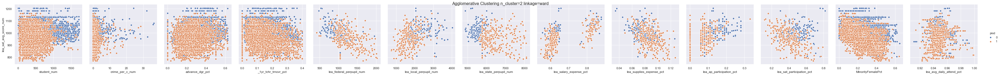

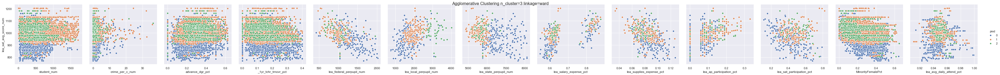

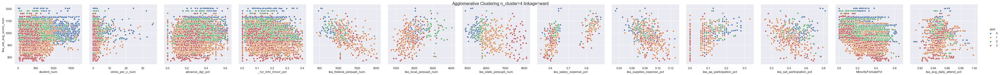

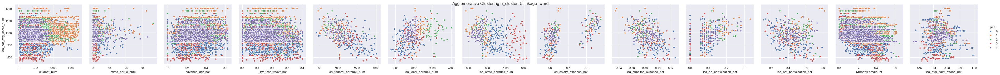

In [27]:
model_df = cluster_stats.loc[(cluster_stats['Model Name'] == 'Agglomerative Clustering')]
model_df = model_df.groupby(['Cluster Size']).head(1)

for i, row in model_df.iterrows():
    name = row['Model Name'] + " " + row['Paramaters']
    plot_model(df_clustering, row['Model'], name)

###### We first look at our overall best clustering models the Agglomerative Clustering group.   Since this was modeled on a 14th dimensional object it is not necessarly easy to visualize it on a 2d plane and this is very apparent when we try to look at anything past the 2 or 3 cluster sizes.  However none of these help us just by looking to determine which clustering size would be better. 

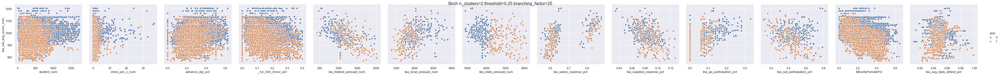

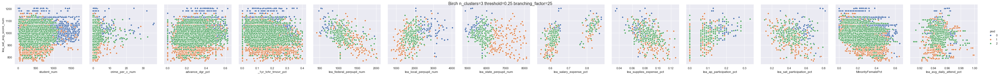

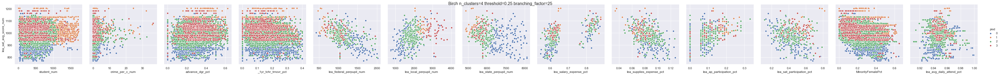

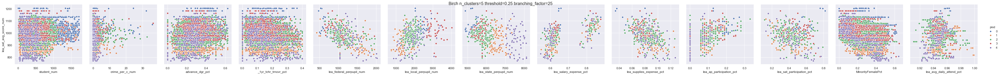

In [28]:
model_df = cluster_stats.loc[(cluster_stats['Model Name'] == 'Birch')]
model_df = model_df.groupby(['Cluster Size']).head(1)

for i, row in model_df.iterrows():
    name = row['Model Name'] + " " + row['Paramaters']
    plot_model(df_clustering, row['Model'], name)

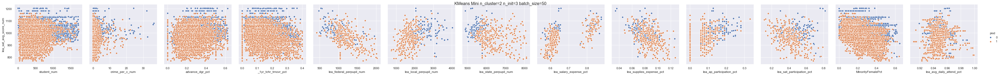

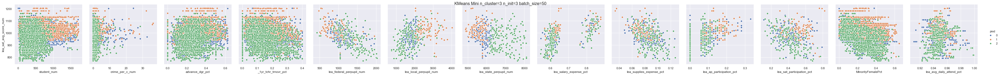

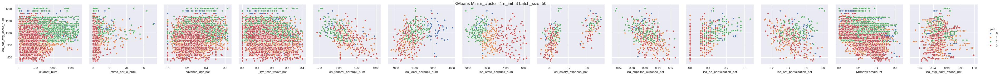

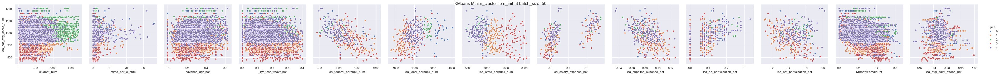

In [29]:
model_df = cluster_stats.loc[(cluster_stats['Model Name'] == 'KMeans Mini')]
model_df = model_df.groupby(['Cluster Size']).head(1)

for i, row in model_df.iterrows():
    name = row['Model Name'] + " " + row['Paramaters']
    plot_model(df_clustering, row['Model'], name)

###### When looking at both the Birch and Kmeans, we again  find it difficult to visualize in a manner that would lead us to believe any of the models or cluster sizes are superior and this might require a finer level of domain knowledge to truly be decided

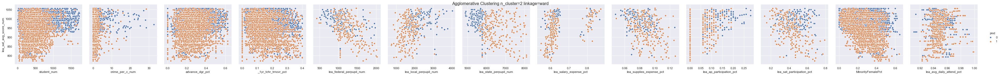

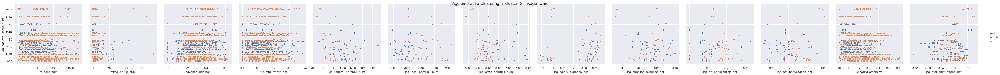

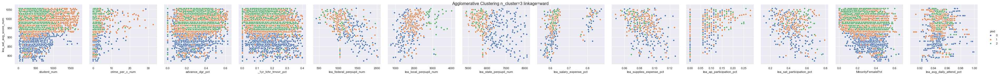

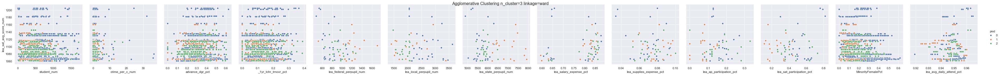

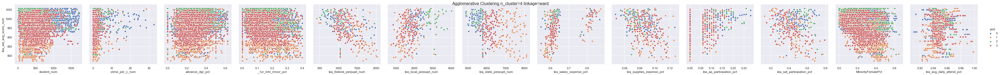

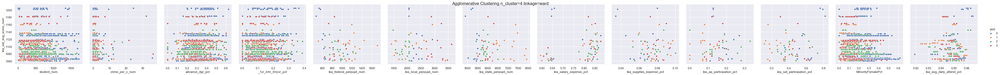

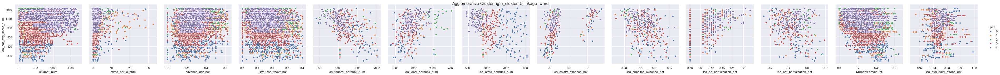

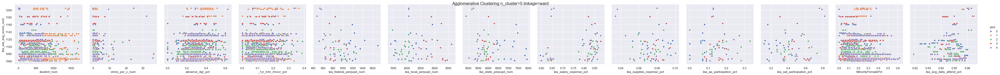

In [30]:
model_df = cluster_stats.loc[(cluster_stats['Model Name'] == 'Agglomerative Clustering')]
model_df = model_df.groupby(['Cluster Size']).head(1)

df_test1 = df_clustering.loc[(df_clustering['lea_sat_avg_score_num'] > 1060)]
df_test0 = df_clustering.loc[(df_clustering['lea_sat_avg_score_num'] < 1060)]

for i, row in model_df.iterrows():
    name = row['Model Name'] + " " + row['Paramaters']
    plot_model(df_test0, row['Model'], name)
    plot_model(df_test1, row['Model'], name)

###### In a final attempt to better understandvisually each cluster, we split out the average sat score into two groups: one above the national average and one below.  This however did little to strengthen our understanding of the clusters and at this time currently leaves us without knowing which cluster size is most apporapriate.  As mentioned previously cluster size of two seems too small to be helpful so we are again left with suggesting based purely on score and reverting to our pervious statement that Agglomerative Clustering with four clusters is the recommended option. We would only be able to reach a different conclusion with a domain expert to consult. 


# Modeling and Evaluation 4

Summarize the Ramifications
Describe your results. What findings are the most interesting and why?

###### The results for this exercise were very mixed.  While it is easy to run a model and create clusters, the interpretation of them is very difficult.

###### First if we simply focused on maximizing visual interpretability, when the  cluster numbers are lower, it is easier for the human mind to see a perceived pattern even if it isn’t there.

###### However, if our main goal is to get the best score possible, we can reach this by increasing the cluster count higher and higher, even if this decreases the visual interpretability mentioned above. 


In [31]:
from sklearn.cluster import MiniBatchKMeans

model_name = 'KMeans Mini'
kmean = pd.DataFrame()
## test, n_clusters, batch_size, ...
for C in range(100, 1010, 10):
    for N in range(1, 2, 1):
        model_para = 'n_cluster=' + str(int(C)) + " n_init=" + str(int(N)) + " batch_size=" + str(250)
        km_model = MiniBatchKMeans(n_clusters=C, batch_size=250, random_state=101) 
        run_model_cluster(df_clustering, model_name, model_para, C, km_model)

KMeans Mini n_cluster=100 n_init=1 batch_size=250: score:1.1756 execute:0.3333
KMeans Mini n_cluster=110 n_init=1 batch_size=250: score:1.1569 execute:0.4324
KMeans Mini n_cluster=120 n_init=1 batch_size=250: score:1.1684 execute:0.5124
KMeans Mini n_cluster=130 n_init=1 batch_size=250: score:1.1591 execute:0.4934
KMeans Mini n_cluster=140 n_init=1 batch_size=250: score:1.1415 execute:0.6115
KMeans Mini n_cluster=150 n_init=1 batch_size=250: score:1.1462 execute:0.5535
KMeans Mini n_cluster=160 n_init=1 batch_size=250: score:1.1669 execute:0.5845
KMeans Mini n_cluster=170 n_init=1 batch_size=250: score:1.1118 execute:0.6145
KMeans Mini n_cluster=180 n_init=1 batch_size=250: score:1.1117 execute:0.7386
KMeans Mini n_cluster=190 n_init=1 batch_size=250: score:1.0952 execute:0.6475
KMeans Mini n_cluster=200 n_init=1 batch_size=250: score:1.0999 execute:0.6686
KMeans Mini n_cluster=210 n_init=1 batch_size=250: score:1.087 execute:0.7206
KMeans Mini n_cluster=220 n_init=1 batch_size=250: sc

Our goal in this project was to try and identify factors that could be related to our measure of success - we chose to look specifically at SAT scores. If there were clear centroids around, perhaps, AP class participation we could have some insight to provide to the school districts at large, or teachers and parents. For the most part
Because we are performing clustering on high dimensional data, our visuals don't show any clear results to the reader simply by looking at them. Although our models performed well in terms of validation, it would be more effective to reduce the sets of factors. 

Without domain expert knowledge, we cannot communicate any useful information to the schoolboard or any other interested parties. Our previous work with this dataset in the semester was perhaps more easily interpretable and communicable to those working in the education field because it is easier, for example, to determine the choices made by a decision tree algorithm.

In this class, we see a lot of instances where, although a model can fit "well" in terms of statistical significance or other mathematical factors, it may not necessarily translate to significance in the real world. We as analysts must be able to explain why the algorithm fits the data so that the beneficiary of our work doesn't end up with a "black box" algorithm that overfits and doesn't explain the model.

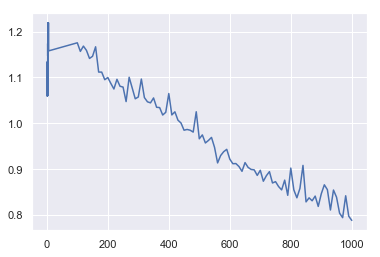

In [32]:
plot_df = cluster_stats.loc[(cluster_stats['Model Name'] == 'KMeans Mini')]

plt.plot(plot_df['Cluster Size'], plot_df['Score'])

###### By running Kmeans (our fastest model) with cluster sizes from 100 to 1000 we see that we can increase the Score but at the cost of any level of usefulness. There needs to be a balance between the usefulness and ease of interpretation and a higher Score

# Deployment

Be critical of your performance and tell the reader how you current model might be usable by other parties. Did you achieve your goals? If not, can you reign in the utility of your modeling? 

- How useful is your model for interested parties (i.e., the companies or organizations that might want to use it)?
###### The model might be more useful if someone with heavy domain knowledge looked over the clusters and could better understand which demographic each one covered but without that piece it is currently not very useful beyond the previous work we have done with this dataset. In our previous studies, we came up with much more applicable models for policy-makers or other educational workers. In general though, these types of models could be useful to, like mentioned above, policy-makers for educations and perhaps tutoring services (for profit or non-profit) that hope to break into a market of students that are looking to perform at higher levels. School boards could be looking to find answers to what factors lead to teacher turnover rates or graduation rates and these models could be used to predict or find relationships in those outcomes. 


- How would your deploy your model for interested parties? 
###### This model is generated once per year, since the root data is a yearly gather, so it would seem wasteful to setup an api for this data.  Instead, this would be more suited to be generated and sent out when available.  It would also be good practice to send the full notebook so users with more domain knowledge in the field could easily filter the data in ways to be more enlightening and practically applicable. 


- What other data should be collected? 
###### physical location and geographical location is always helpful when trying to find patterns with things that are tied to a physical location.  Many factors might affect a location that may not be tied to the people that visit/attend/work there. There could be, for example,  socioeconomic factors contributing to performance like we saw with local expenditures being more highly correlated with SAT scores than federal or even state expenditures. If we wanted to ever evaluate the effectiveness of the models we built to determine "successful" SAT outcomes for students, we would need to measure schools who implemented programs to effect the levels of the factors associated with better SAT scores and see whether this changed the outcome of those students. 


- How often would the model need to be updated, etc.?
###### Since this data only changes when a new school year is added it does not need to be reran often. It needs to be updated annually with the cycle of the school year when standardized tests and final grade scores are calculated.  In the case where more schools in the state were added that had previously not been accounted for or more states were added we would need to retrain, but in general this is a once a year training dataset. 



# Exceptional Work

In [34]:
cluster_stats.count()

Model Name        179
Paramaters        179
Cluster Size      179
Execution Time    179
Score             179
Model             179
dtype: int64

####  Modeling and Evaluation 1
###### We evaluated our clustering with 3 different algorithms with 179 trained models.  For this we focused on functionalizing our model building and storing of models and useful statistics.  This gave us the flexibility to futher visualize and inspect our findings and allow new users to get the same benifit without having to rewrite any of our code.

####  Modeling and Evaluation 2
###### We used our existing cluster statistics data frame to evaluate the performance of our models without any retraining to maintain the integrity of our results throughout this section and all other sections of our lab.

#### Modeling and Evaluation 4
###### We included code to back up some of our assertions and cliams about the pitfalls of maximizing Score above all else.